**Importing Required Packages**

In [1]:
#Importing the basic librarires

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
sns.set_style('whitegrid')
import warnings 
warnings.filterwarnings('ignore')
%matplotlib inline

**Importing Dataset**

In [2]:
df=pd.read_csv("C:/Users/dhine/Desktop/ML/Projects/02 Walmart Project - Self/Walmart DataSet.csv")

In [3]:
df.head(2)

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106


In [4]:
df.tail(2)

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
6433,45,19-10-2012,718125.53,0,56.47,3.969,192.330854,8.667
6434,45,26-10-2012,760281.43,0,58.85,3.882,192.308899,8.667


**Exploring the Dataset**

In [5]:
df.shape

(6435, 8)

**Cheak Null Values in Dataset**

In [6]:
df.isnull().sum()

Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


**Need to convert the datatype of Date colum to datetime**

In [8]:
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df.index = df['Date']

In [9]:
df.describe()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
count,6435.000000,6435,6.435000e+03,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000
mean,23.000000,2011-06-17 00:00:00,1.046965e+06,0.069930,60.663782,3.358607,171.578394,7.999151
min,1.000000,2010-02-05 00:00:00,2.099862e+05,0.000000,-2.060000,2.472000,126.064000,3.879000
25%,12.000000,2010-10-08 00:00:00,5.533501e+05,0.000000,47.460000,2.933000,131.735000,6.891000
50%,23.000000,2011-06-17 00:00:00,9.607460e+05,0.000000,62.670000,3.445000,182.616521,7.874000
75%,34.000000,2012-02-24 00:00:00,1.420159e+06,0.000000,74.940000,3.735000,212.743293,8.622000
max,45.000000,2012-10-26 00:00:00,3.818686e+06,1.000000,100.140000,4.468000,227.232807,14.313000
std,12.988182,NaN,5.643666e+05,0.255049,18.444933,0.459020,39.356712,1.875885


**a. If the weekly sales are affected by the unemployment rate, if yes - which stores are suffering the most?**

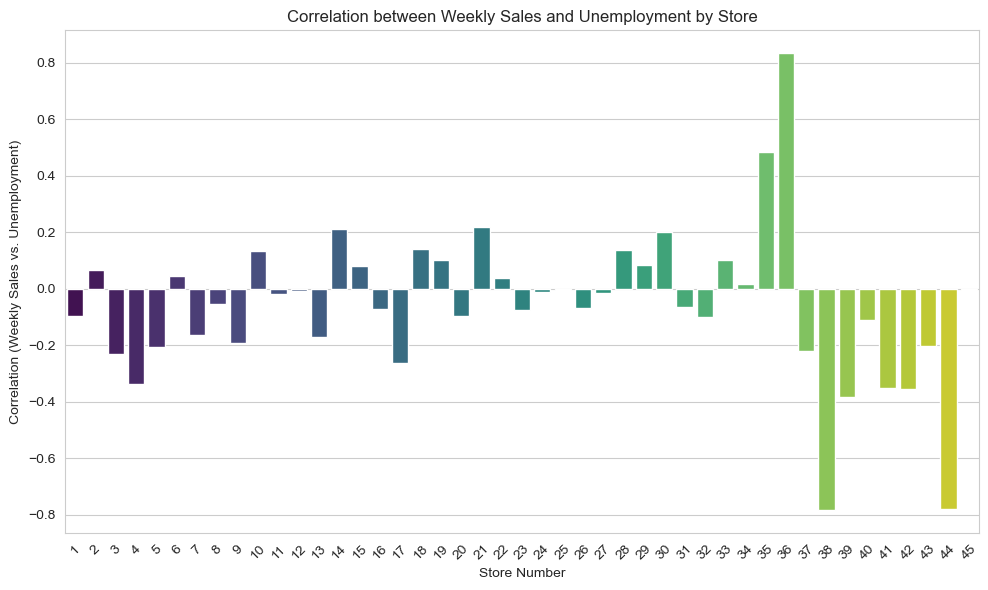

In [10]:
# Calculate the correlation between weekly sales and unemployment rate for each store
correlation_by_store = df.groupby('Store')[['Weekly_Sales', 'Unemployment']].corr().iloc[0::2, -1].reset_index()
correlation_by_store = correlation_by_store.rename(columns={'Unemployment': 'Correlation'})

# Sort stores by the strength of correlation (negative values indicate a negative correlation)
most_affected_stores = correlation_by_store.sort_values(by='Correlation', ascending=True)

# Create a scatter plot to visualize the relationship
plt.figure(figsize=(10, 6))
#plt.scatter(most_affected_stores['Store'], most_affected_stores['Correlation'], marker='o', color='b')
sns.barplot(data=most_affected_stores, x='Store', y='Correlation', palette='viridis')

plt.xlabel('Store Number')
plt.ylabel('Correlation (Weekly Sales vs. Unemployment)')
plt.title('Correlation between Weekly Sales and Unemployment by Store')
plt.xticks(rotation=45)  # Rotate store numbers for better readability
#plt.grid(True)

# Show the scatter plot
plt.tight_layout()
plt.show()

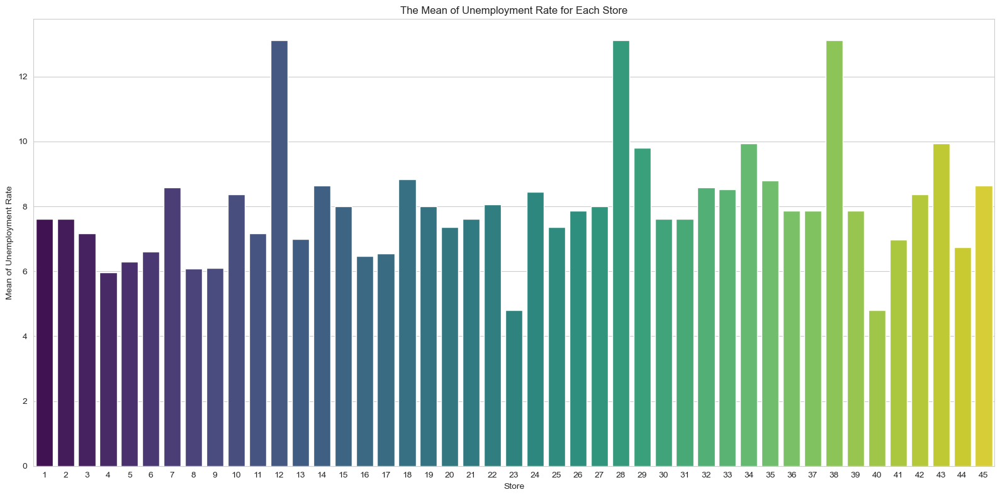

In [11]:
plt.figure(figsize=(16,8))
store_df2 = df.groupby("Store")["Unemployment"].mean().to_frame().reset_index()
sns.barplot(x=store_df2["Store"],y=store_df2["Unemployment"],palette="viridis")
plt.ylabel("Mean of Unemployment Rate")
plt.title("The Mean of Unemployment Rate for Each Store")
plt.tight_layout()

**b. If the weekly sales show a seasonal trend, when and what could be the reason?**

**Stationarity test**

In [12]:
from statsmodels.tsa.stattools import adfuller
# p-value>0.05 --> not stationary --> Null Hyp
# p-value<0.05 --> stationary --> Alt Hyp
result = adfuller(df['Weekly_Sales'])
p_value = result[1]
print(p_value)
if p_value<0.05:
    print('Stationary')
else:
    print('Not stationary')

0.00011655869699901318
Stationary


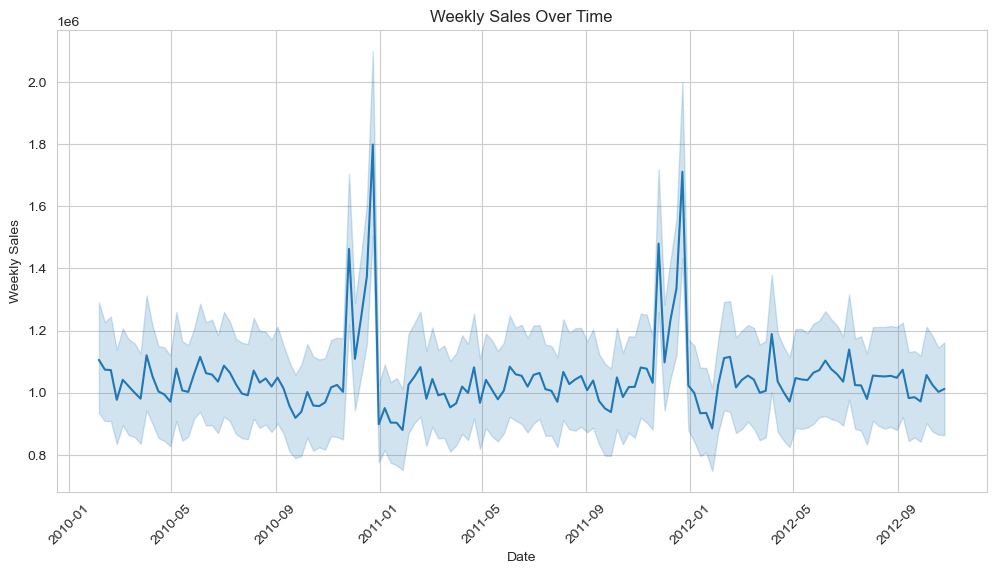

In [13]:
# Create a time series plot to visualize weekly sales over time
plt.figure(figsize=(12, 6))
sns.lineplot(x='Date', y='Weekly_Sales', data=df)
plt.xlabel('Date')
plt.ylabel('Weekly Sales')
plt.title('Weekly Sales Over Time')
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

**c. Does temperature affect the weekly sales in any manner?**

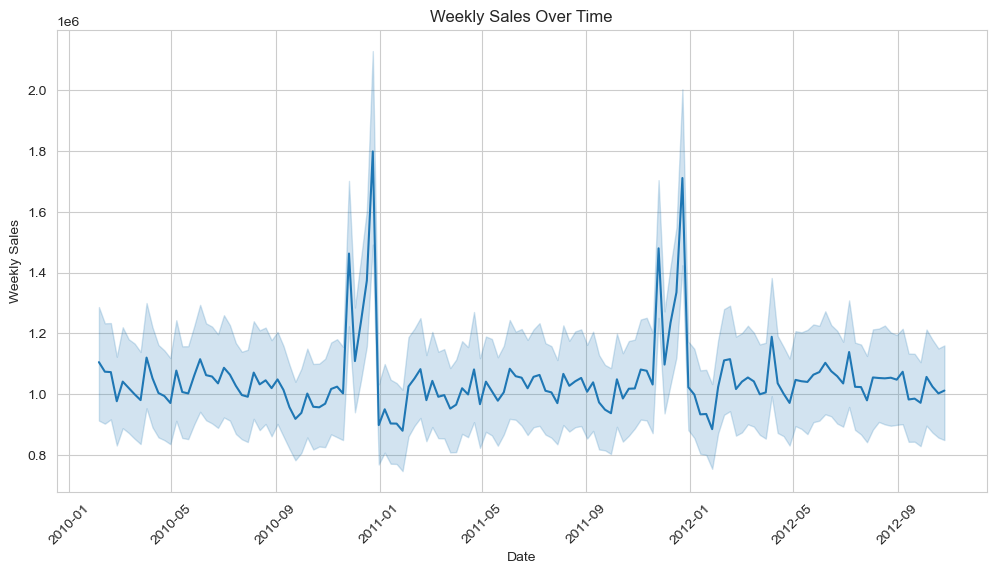

In [14]:
# Create a time series plot to visualize weekly sales over time
plt.figure(figsize=(12, 6))
sns.lineplot(x='Date', y='Weekly_Sales', data=df)
plt.xlabel('Date')
plt.ylabel('Weekly Sales')
plt.title('Weekly Sales Over Time')
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

**d. How is the Consumer Price index affecting the weekly sales of various stores?**

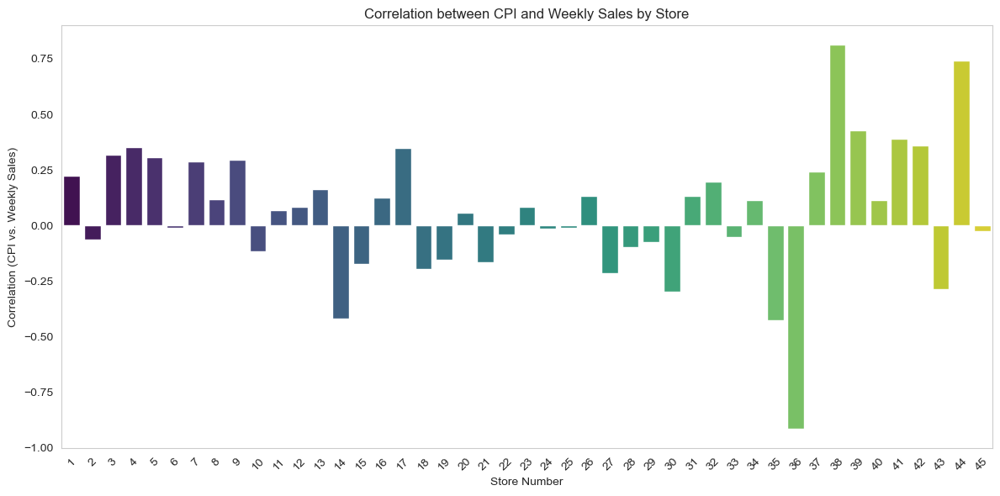

In [15]:
# Calculate the correlation between CPI and weekly sales for each store
correlation_by_store = df.groupby('Store')[['CPI', 'Weekly_Sales']].corr().iloc[0::2,-1].reset_index()


correlation_by_store = correlation_by_store.rename(columns={'level_1': 'Correlation'})
#correlation_by_store

# Sort stores by the strength of correlation
correlation_by_store1 = correlation_by_store.sort_values(by='Weekly_Sales', ascending=False)

# Create a bar chart to visualize the relationship
plt.figure(figsize=(12, 6))
sns.barplot(data=correlation_by_store1, x='Store', y='Weekly_Sales', palette='viridis')
plt.xlabel('Store Number')
plt.ylabel('Correlation (CPI vs. Weekly Sales)')
plt.title('Correlation between CPI and Weekly Sales by Store')
plt.xticks(rotation=45)  # Rotate store numbers for better readability
plt.grid(axis='y')

# Show the bar chart
plt.tight_layout()
plt.show()

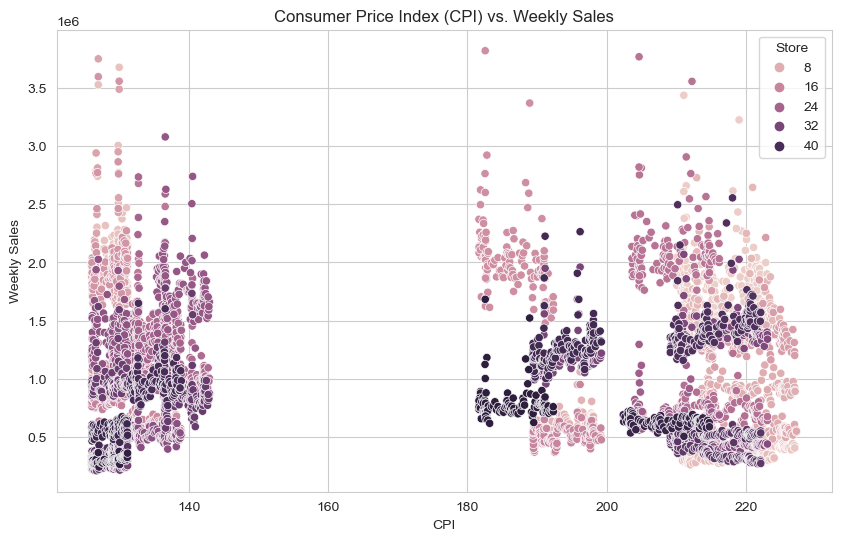

In [16]:
# Scatter plot to visualize the relationship between CPI and Weekly Sales
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='CPI', y='Weekly_Sales', hue='Store')
plt.title("Consumer Price Index (CPI) vs. Weekly Sales")
plt.xlabel("CPI")
plt.ylabel("Weekly Sales")
plt.show()

**e. Top performing stores according to the historical data.**

Top 5 performing stores according to the historical data provided are: [20, 4, 14, 13, 2]
 The Worst 5 performing stores according to the historical data provided are: [38, 36, 5, 44, 33]


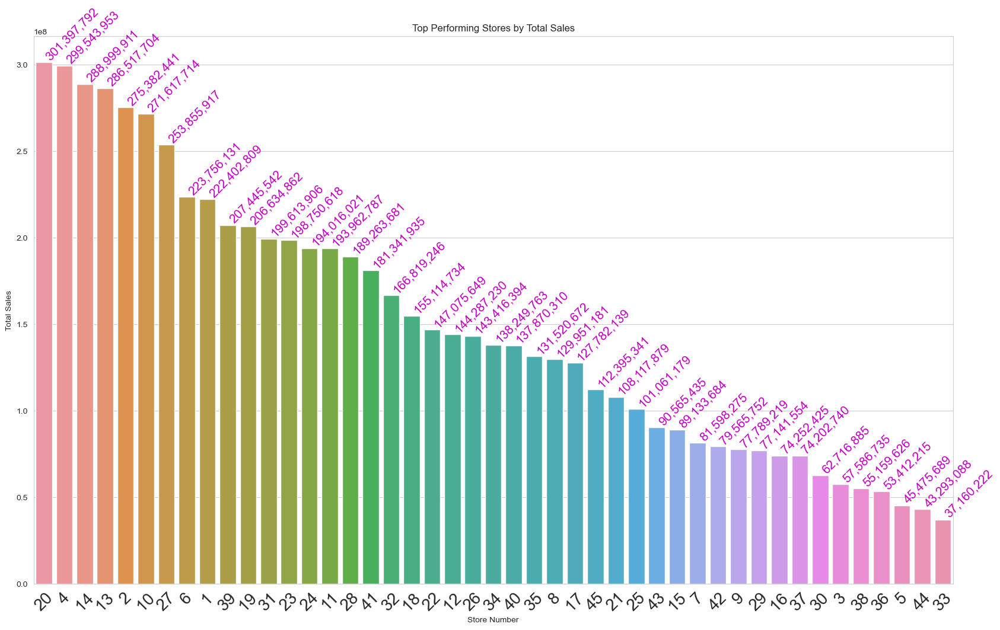

In [17]:
def top_performing_stores():
    grouped_stores = df.groupby('Store').agg(total_sales = ('Weekly_Sales','sum'),
                                            avg_sales = ('Weekly_Sales','mean')).sort_values(by = 'total_sales', ascending=False)
    plt.figure(figsize = (20,12))
    # order is not specified, then barplot arranges the xlabels in ascending order if they are of int type
    ax = sns.barplot(x= grouped_stores.index, y = grouped_stores['total_sales'], order = grouped_stores.index)
    
    plt.xticks(rotation = 45, fontsize = 20)
    plt.xlabel('Store Number')
    plt.ylabel('Total Sales')
    plt.title('Top Performing Stores by Total Sales')
    plt.xticks(rotation=45)  # Rotate store numbers for better readability
    for i, v in enumerate(grouped_stores['total_sales'].items()):
        ax.text(i, v[1],"{:,}".format(round(v[1])), color = 'm', va = 'bottom', rotation = 45, fontsize = 15)
    print("Top 5 performing stores according to the historical data provided are:", grouped_stores.index.to_list()[:5])
    print(" The Worst 5 performing stores according to the historical data provided are:", grouped_stores.index.to_list()[-5:] )
    return grouped_stores

grouped_store_performance =  top_performing_stores()

**f. The worst performing store, and how significant is the difference between the highest and lowest performing stores.**

In [18]:
# Calculate the total sales for each store
store_sales = df.groupby('Store')['Weekly_Sales'].sum().reset_index()

# Find the store with the lowest total sales
worst_performing_store = store_sales.loc[store_sales['Weekly_Sales'].idxmin()]

# Find the store with the highest total sales
best_performing_store = store_sales.loc[store_sales['Weekly_Sales'].idxmax()]

# Calculate the difference between the highest and lowest performing stores
difference = best_performing_store['Weekly_Sales'] - worst_performing_store['Weekly_Sales']

print("Worst Performing Store:")
print(worst_performing_store)

print("\nBest Performing Store:")
print(best_performing_store)

print("\nDifference between Highest and Lowest Performing Stores:")
print(difference)

Worst Performing Store:
Store                 33.00
Weekly_Sales    37160221.96
Name: 32, dtype: float64

Best Performing Store:
Store           2.000000e+01
Weekly_Sales    3.013978e+08
Name: 19, dtype: float64

Difference between Highest and Lowest Performing Stores:
264237570.49999997


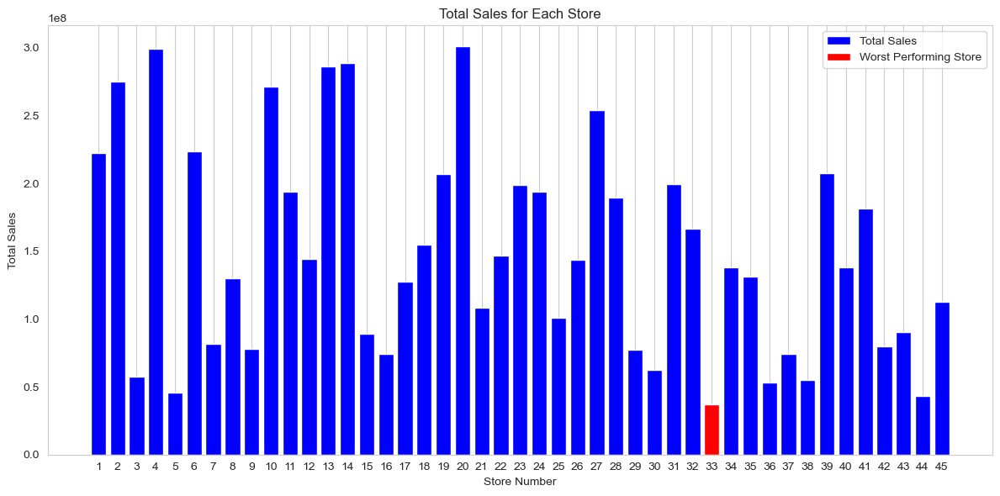

In [19]:
# Calculate the total sales for each store
store_sales = df.groupby('Store')['Weekly_Sales'].sum().reset_index()

# Find the store with the lowest total sales
worst_performing_store = store_sales.loc[store_sales['Weekly_Sales'].idxmin()]

# Create a bar chart to visualize the total sales for all stores
plt.figure(figsize=(12, 6))
plt.bar(store_sales['Store'], store_sales['Weekly_Sales'], color='b', label='Total Sales')
plt.xlabel('Store Number')
plt.ylabel('Total Sales')
plt.title('Total Sales for Each Store')
plt.xticks(store_sales['Store'])
plt.grid(axis='y')

# Highlight the worst-performing store with a different color
plt.bar(worst_performing_store['Store'], worst_performing_store['Weekly_Sales'], color='r', label='Worst Performing Store')
plt.legend()

# Show the bar chart
plt.tight_layout()
plt.show()

<Axes: xlabel='Date'>

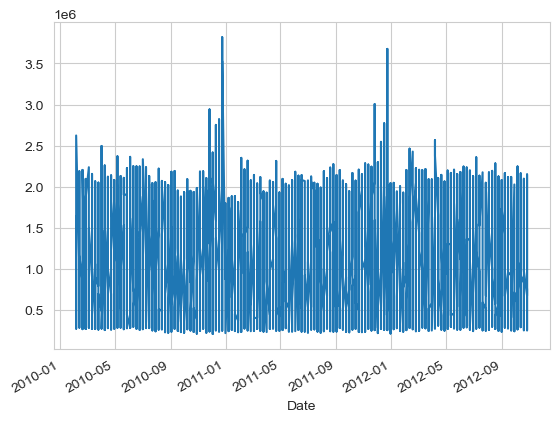

In [20]:
df['Weekly_Sales'].plot()

In [21]:
### ADD Day Month Year Week Day Name
df1 = df.copy()
df1['Month'] = df.Date.dt.month
df1['Year'] = df.Date.dt.year
df1['Day'] = df.Date.dt.day
df1['day_name'] = df.Date.dt.day_name()
df1['week'] = df.Date.dt.isocalendar().week
df1.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Month,Year,Day,day_name,week
Date,,,,,,,,,,,,,
2010-02-05,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106,2,2010,5,Friday,5
2010-02-12,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106,2,2010,12,Friday,6
2010-02-19,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,2,2010,19,Friday,7
2010-02-26,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,2,2010,26,Friday,8
2010-03-05,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106,3,2010,5,Friday,9


**EDA statistical Analysis**

In [22]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 6435 entries, 2010-02-05 to 2012-10-26
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Store         6435 non-null   int64         
 1   Date          6435 non-null   datetime64[ns]
 2   Weekly_Sales  6435 non-null   float64       
 3   Holiday_Flag  6435 non-null   int64         
 4   Temperature   6435 non-null   float64       
 5   Fuel_Price    6435 non-null   float64       
 6   CPI           6435 non-null   float64       
 7   Unemployment  6435 non-null   float64       
 8   Month         6435 non-null   int32         
 9   Year          6435 non-null   int32         
 10  Day           6435 non-null   int32         
 11  day_name      6435 non-null   object        
 12  week          6435 non-null   UInt32        
dtypes: UInt32(1), datetime64[ns](1), float64(5), int32(3), int64(2), object(1)
memory usage: 609.6+ KB


<Axes: xlabel='Month', ylabel='Weekly_Sales'>

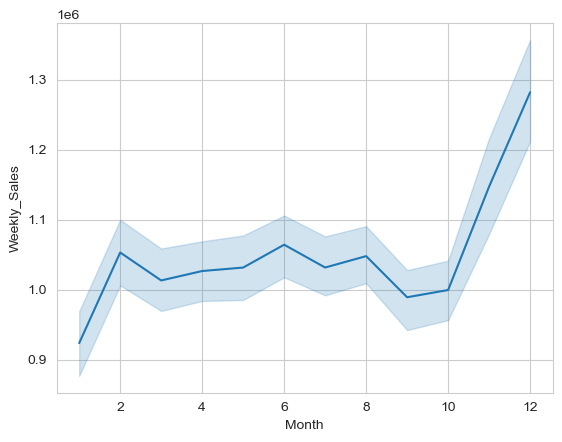

In [23]:
sns.lineplot(x='Month',y='Weekly_Sales', data=df1)

<Axes: xlabel='Month', ylabel='Weekly_Sales'>

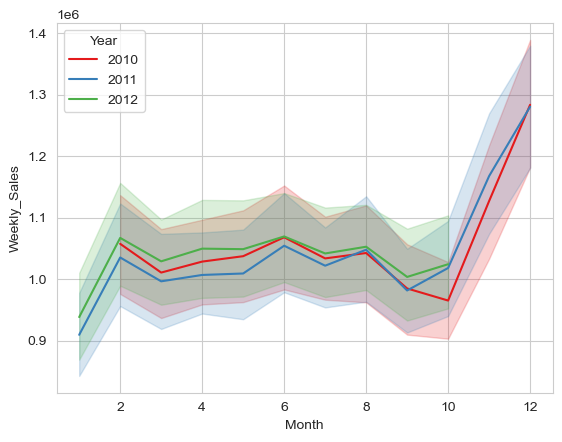

In [24]:
sns.lineplot(x='Month',y='Weekly_Sales', data=df1, hue='Year', palette='Set1')

<Axes: xlabel='Month', ylabel='Weekly_Sales'>

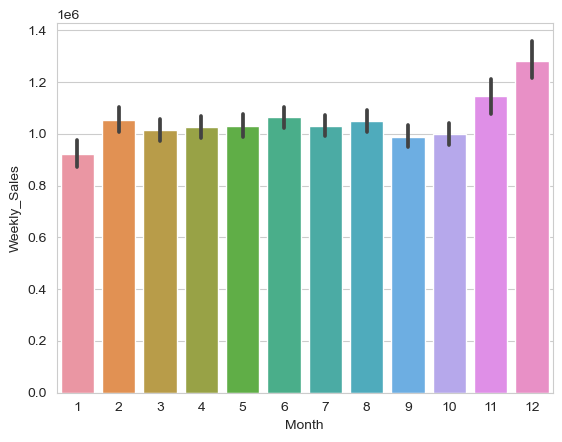

In [25]:
sns.barplot(x='Month',y='Weekly_Sales', data=df1)

<Axes: xlabel='week', ylabel='Weekly_Sales'>

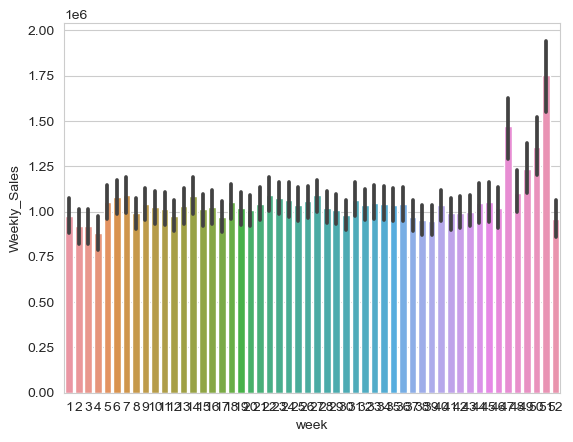

In [26]:
sns.barplot(x='week',y='Weekly_Sales', data=df1)

In [27]:
col_list = df.columns
col_list

Index(['Store', 'Date', 'Weekly_Sales', 'Holiday_Flag', 'Temperature',
       'Fuel_Price', 'CPI', 'Unemployment'],
      dtype='object')

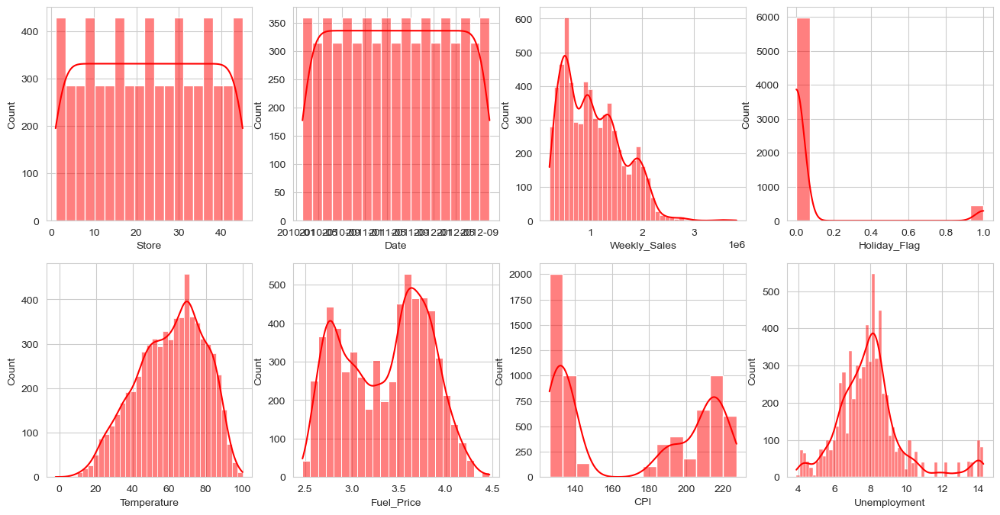

In [28]:
plt.subplots(2,4, figsize=(16,8))
i = 1
for col in col_list:
    plt.subplot(2,4,i)
    sns.histplot(df[col],kde=True,color='red')
    i += 1

**Seperating the dataframe based on the stores**

In [29]:
Stores = {}
for i in range(1,len(df.Store.unique())+1):
    Stores[i] = df1[df1['Store'] == i]

In [30]:
Stores

{1:             Store       Date  Weekly_Sales  Holiday_Flag  Temperature  \
 Date                                                                    
 2010-02-05      1 2010-02-05    1643690.90             0        42.31   
 2010-02-12      1 2010-02-12    1641957.44             1        38.51   
 2010-02-19      1 2010-02-19    1611968.17             0        39.93   
 2010-02-26      1 2010-02-26    1409727.59             0        46.63   
 2010-03-05      1 2010-03-05    1554806.68             0        46.50   
 ...           ...        ...           ...           ...          ...   
 2012-09-28      1 2012-09-28    1437059.26             0        76.08   
 2012-10-05      1 2012-10-05    1670785.97             0        68.55   
 2012-10-12      1 2012-10-12    1573072.81             0        62.99   
 2012-10-19      1 2012-10-19    1508068.77             0        67.97   
 2012-10-26      1 2012-10-26    1493659.74             0        69.16   
 
             Fuel_Price         C

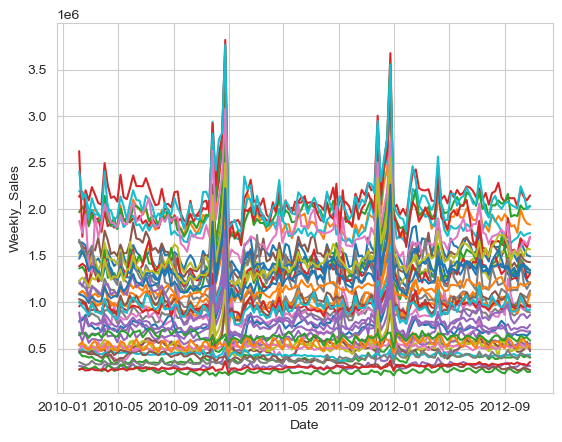

In [31]:
for i in range(1,46):
    sns.lineplot(data=Stores[i],y='Weekly_Sales', x='Date')

**Visualize all the stores**

**Date vs Weekly_Sales of all 45 stores**

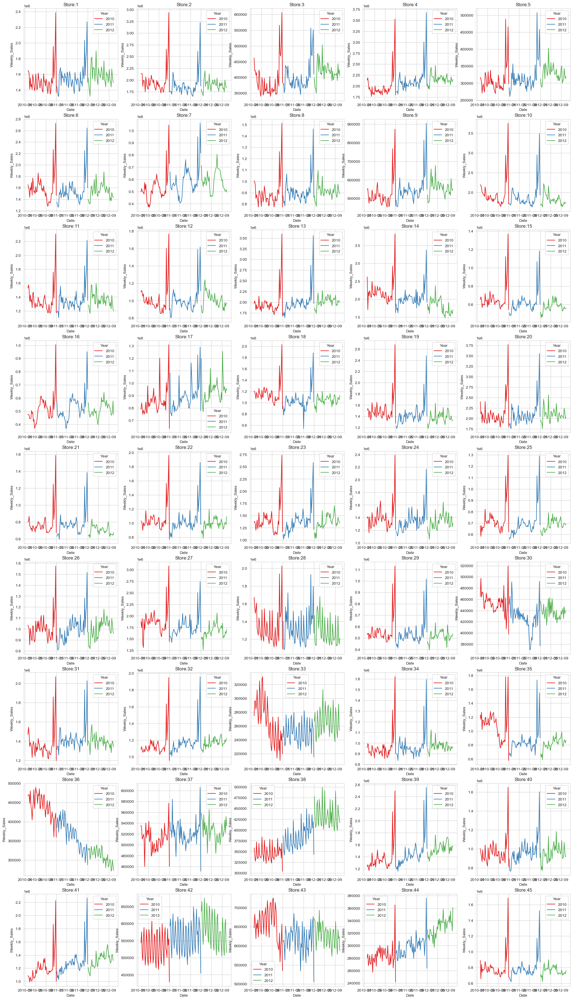

In [32]:
plt.subplots(9,5, figsize=(25,45))
for i in range (1,46):
    plt.subplot(9,5,i)
    sns.lineplot(x='Date', y='Weekly_Sales', data=Stores[i], hue='Year',palette='Set1')
    plt.title(f'Store:{i}')

**Temperature vs Weekly_Sales**

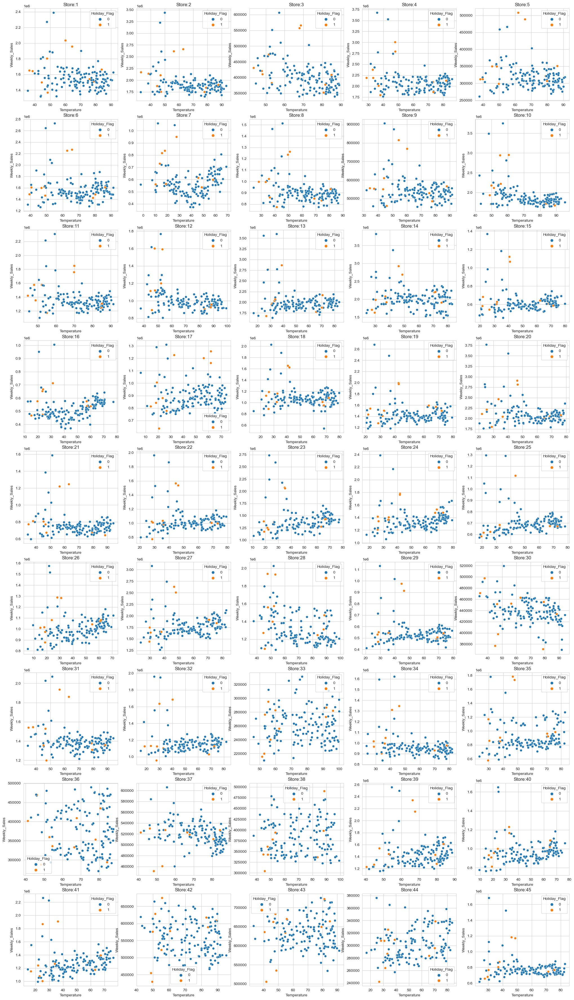

In [33]:
plt.subplots(9,5, figsize=(25,45))
for i in range (1,46):
    plt.subplot(9,5,i)
    sns.scatterplot(x='Temperature', y='Weekly_Sales', data=Stores[i], hue='Holiday_Flag')
    plt.title(f'Store:{i}')

**CPI vs Weekly_Sales**

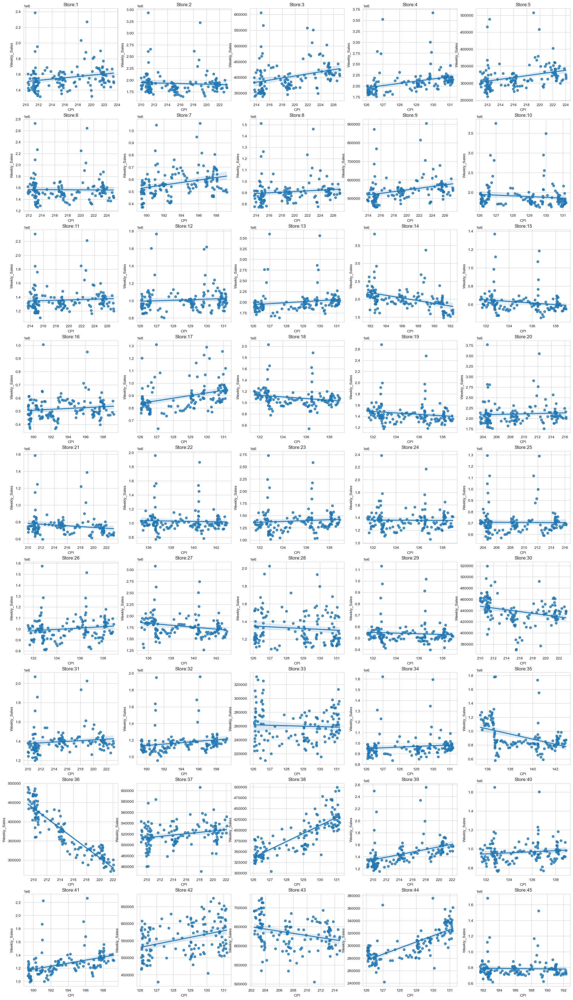

In [34]:
plt.subplots(9,5, figsize=(25,45))
for i in range (1,46):
    plt.subplot(9,5,i)
    sns.regplot(x='CPI', y='Weekly_Sales', data=Stores[i])
    plt.title(f'Store:{i}')

**Unemployment vs Weekly_Sales**

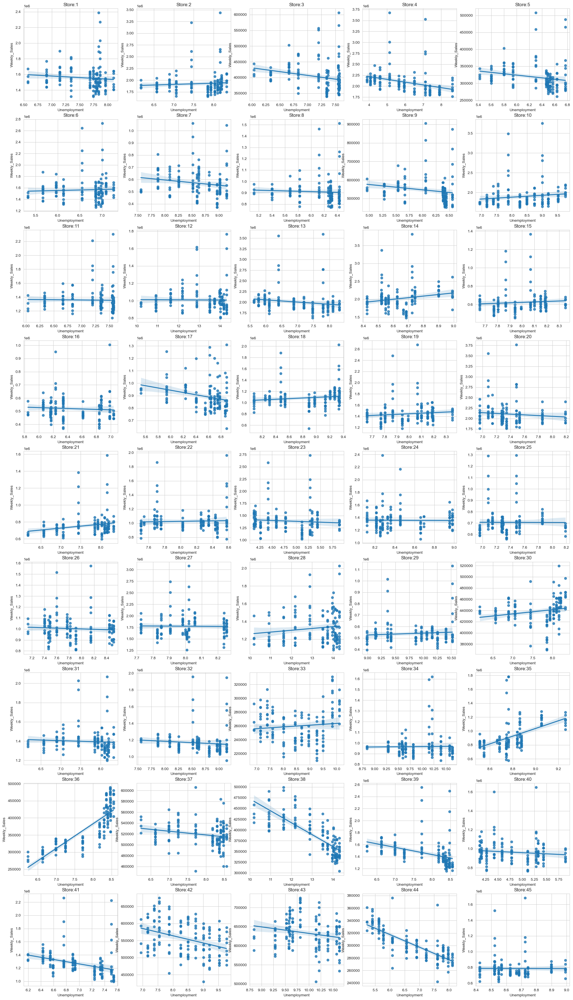

In [35]:
plt.subplots(9,5, figsize=(25,45))
for i in range (1,46):
    plt.subplot(9,5,i)
    sns.regplot(x='Unemployment', y='Weekly_Sales', data=Stores[i])
    plt.title(f'Store:{i}')

**Time series and Forecasting**

In [36]:
df1 = Stores[1]
df1 = df1.loc[:,['Date', 'Weekly_Sales']]
df1.index = df1['Date']
df1.drop(['Date'], axis=1, inplace=True)
df1.head()

,Weekly_Sales
Date,
2010-02-05,1643690.90
2010-02-12,1641957.44
2010-02-19,1611968.17
2010-02-26,1409727.59
2010-03-05,1554806.68


In [37]:
df1.shape

(143, 1)

<Axes: xlabel='Date'>

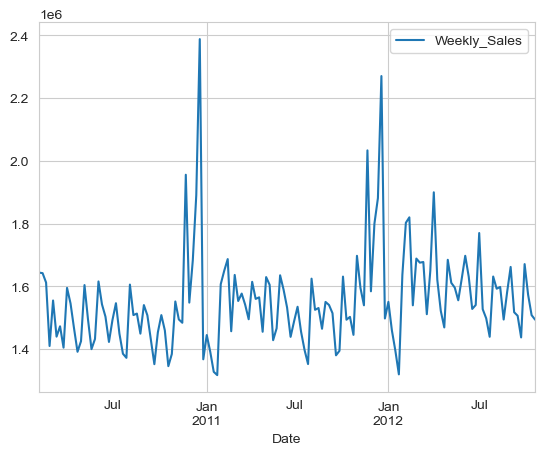

In [38]:
df1.plot()

**Stationarity test**

In [39]:
from statsmodels.tsa.stattools import adfuller
# p-value>0.05 --> not stationary --> Null Hyp
# p-value<0.05 --> stationary --> Alt Hyp
result = adfuller(df1['Weekly_Sales'])
p_value = result[1]
print(p_value)
if p_value<0.05:
    print('Stationary')
else:
    print('Not stationary')

1.3877788330759535e-05
Stationary


In [40]:
# KPSS test( Kwiatkowski–Phillips–Schmidt–Shin test)
from statsmodels.tsa.stattools import kpss
stats,p,lags,critical = kpss(df1['Weekly_Sales'])
if p>0.05:
    print('Stationary')
else:
    print('Not stationary')
print(p)

Not stationary
0.047095888148842614


Seasionality of this data is one year, so we take window 52 (52 weeks per year).

In [41]:
rolling_mean = df1.rolling(window=52).mean()
rolling_mean

,Weekly_Sales
Date,
2010-02-05,NaN
2010-02-12,NaN
2010-02-19,NaN
2010-02-26,NaN
2010-03-05,NaN
...,...
2012-09-28,1.613969e+06
2012-10-05,1.614734e+06
2012-10-12,1.616264e+06


**Removing the trend from the timestamp if trend is present**

In [42]:
rolling_mean_detrended = df1-rolling_mean
rolling_mean_detrended

,Weekly_Sales
Date,
2010-02-05,NaN
2010-02-12,NaN
2010-02-19,NaN
2010-02-26,NaN
2010-03-05,NaN
...,...
2012-09-28,-176909.317308
2012-10-05,56052.084615
2012-10-12,-43190.823077


<Axes: xlabel='Date'>

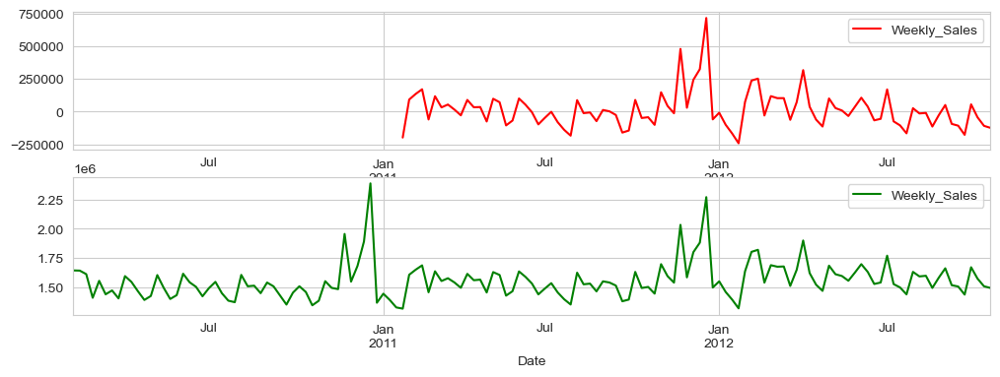

In [43]:
ax1 = plt.subplot(211)
rolling_mean_detrended.plot(figsize=(12,4),color='red',ax=ax1)
ax2 = plt.subplot(212)
df1.plot(figsize=(12,4),color='green',ax=ax2)

**Removing seasonality**

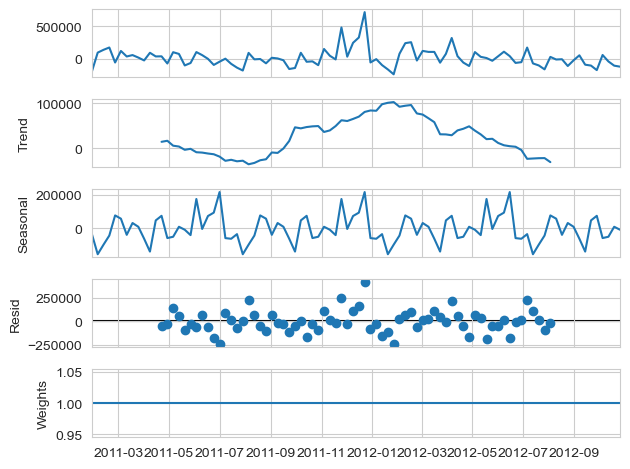

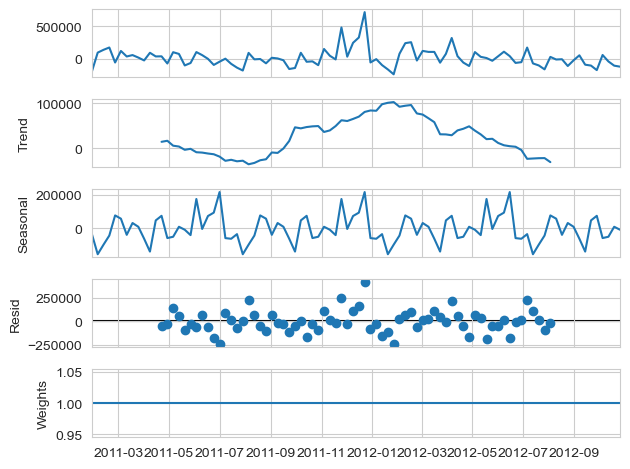

In [44]:
from statsmodels.tsa.seasonal import seasonal_decompose
decompose_result = seasonal_decompose(rolling_mean_detrended.dropna(), period=25)
decompose_result.plot(weights=True)

In [45]:
# removing seasionality
rolling_mean_decomposed_diff = rolling_mean_detrended - rolling_mean_detrended.shift()
rolling_mean_decomposed_diff

,Weekly_Sales
Date,
2010-02-05,NaN
2010-02-12,NaN
2010-02-19,NaN
2010-02-26,NaN
2010-03-05,NaN
...,...
2012-09-28,-69884.058269
2012-10-05,232961.401923
2012-10-12,-99242.907692


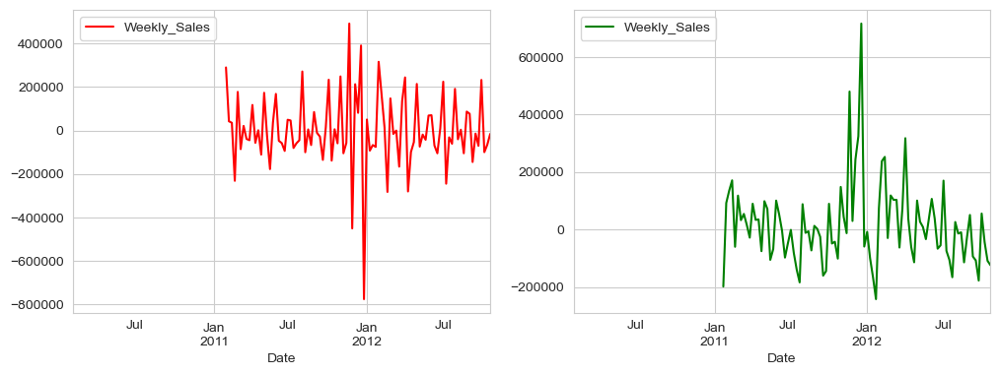

In [46]:
ax1=plt.subplot(121)
rolling_mean_decomposed_diff.plot(figsize=(12,4),color='red',ax=ax1)
ax2=plt.subplot(122)
rolling_mean_detrended.plot(figsize=(12,4),color='green',ax=ax2)
plt.show()

In [47]:
rolling_mean_decomposed_diff.dropna(inplace=True)
rolling_mean_decomposed_diff

,Weekly_Sales
Date,
2011-02-04,290442.987692
2011-02-11,42838.090577
2011-02-18,35787.953654
2011-02-25,-230947.744038
2011-03-04,177896.654423
...,...
2012-09-28,-69884.058269
2012-10-05,232961.401923
2012-10-12,-99242.907692


In [48]:
final = adfuller(rolling_mean_decomposed_diff['Weekly_Sales'])
final[1]

3.257853293563638e-07

**Visualize ACF and PACF to choose the Times seris model**

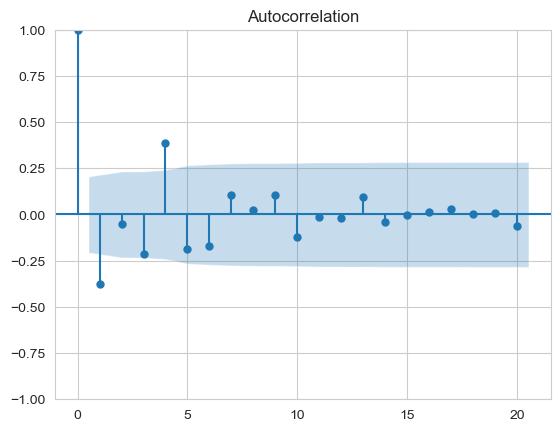

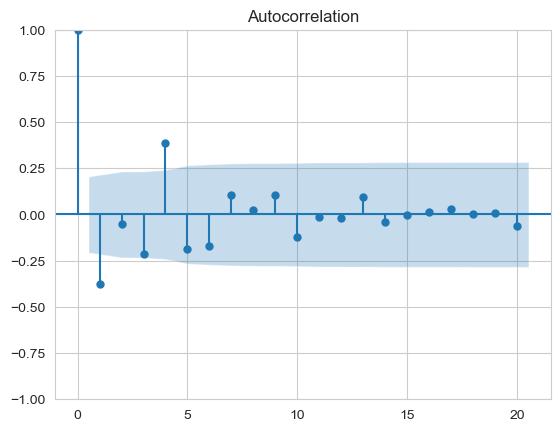

In [49]:
from pandas.plotting import autocorrelation_plot
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plot_acf(rolling_mean_decomposed_diff['Weekly_Sales'])

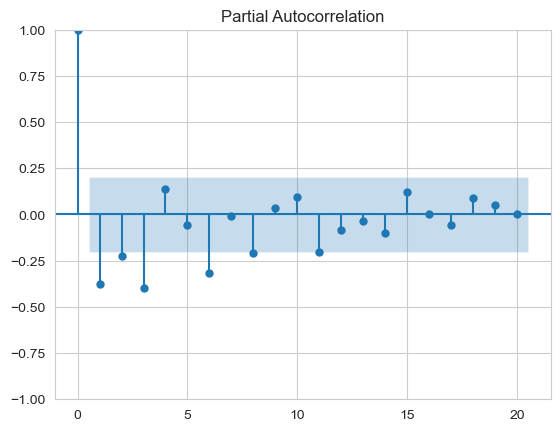

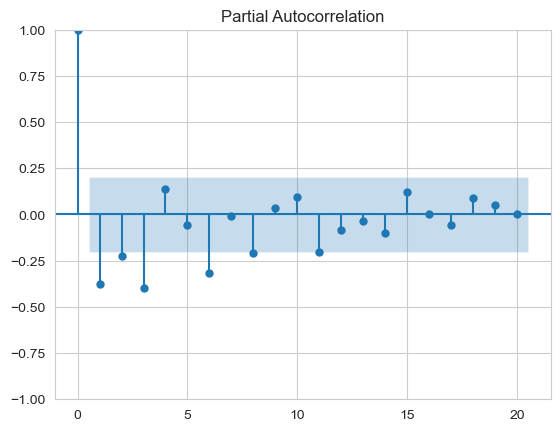

In [50]:
plot_pacf(rolling_mean_decomposed_diff['Weekly_Sales'])

**Choosing the best model using autoarima**

In [51]:
! pip install pmdarima
from pmdarima import auto_arima
order = auto_arima(rolling_mean_decomposed_diff['Weekly_Sales'],trace=True)
order.summary()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=2428.230, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2454.958, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2442.923, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2426.044, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2452.960, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2426.893, Time=0.06 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2426.900, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2428.257, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=2422.325, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=2421.076, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2440.908, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=inf, Time=0.14 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=2424.524, Time=0.12 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=2423.465, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : 

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                   91
Model:               SARIMAX(1, 0, 1)   Log Likelihood               -1207.538
Date:                Sun, 23 Feb 2025   AIC                           2421.076
Time:                        22:42:51   BIC                           2428.608
Sample:                    02-04-2011   HQIC                          2424.115
                         - 10-26-2012                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2370      0.116      2.050      0.040       0.010       0.464
ma.L1         -0.9361      0.054    -17.315      0.000      -1.042      -0.830
sigma2      2.002e+10   7.21e-13   2.78e+22      0.000       2e+10       2e+10
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                83.49
Prob(Q):                              0.92   Prob(JB):                         0.00
Heteroskedasticity (H):               1.21   Skew:                             1.39
Prob(H) (two-sided):                  0.61   Kurtosis:                         6.78
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 5.29e+38. Standard errors may be unstable.
"""

In [52]:
from statsmodels.tsa.arima.model import ARIMA

train = rolling_mean_decomposed_diff.iloc[:73]['Weekly_Sales']
test = rolling_mean_decomposed_diff.iloc[73:]['Weekly_Sales']
# ARIMA ---> AR + MA +I ---> ARIMA--> AR=1 , I=0 , MA=1
model = ARIMA(train, order=(1,0,1))
model_fit = model.fit() # training 
model_fit.summary()

C:\Users\dhine\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\dhine\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\dhine\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:           Weekly_Sales   No. Observations:                   73
Model:                 ARIMA(1, 0, 1)   Log Likelihood                -972.872
Date:                Sun, 23 Feb 2025   AIC                           1953.744
Time:                        22:42:51   BIC                           1962.906
Sample:                    02-04-2011   HQIC                          1957.395
                         - 06-22-2012                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1802.9196   1363.342      1.322      0.186    -869.181    4475.021
ar.L1          0.2757      0.095      2.912      0.004       0.090       0.461
ma.L1         -0.9892      0.131     -7.572      0.000      -1.245      -0.733
sigma2      2.317e+10   4.19e-05   5.53e+14      0.000    2.32e+10    2.32e+10
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                55.00
Prob(Q):                              0.93   Prob(JB):                         0.00
Heteroskedasticity (H):               1.84   Skew:                             1.34
Prob(H) (two-sided):                  0.14   Kurtosis:                         6.31
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 5.3e+30. Standard errors may be unstable.
"""

In [53]:
rolling_mean_decomposed_diff['Predict'] = model_fit.predict(start= len(train), 
                                    end=len(train)+len(test)- 1, 
                                    dynamic=True)
rolling_mean_decomposed_diff['Predict']

Date
2011-02-04            NaN
2011-02-11            NaN
2011-02-18            NaN
2011-02-25            NaN
2011-03-04            NaN
                 ...     
2012-09-28    1802.925716
2012-10-05    1802.921273
2012-10-12    1802.920048
2012-10-19    1802.919710
2012-10-26    1802.919617
Name: Predict, Length: 91, dtype: float64

<Axes: xlabel='Date'>

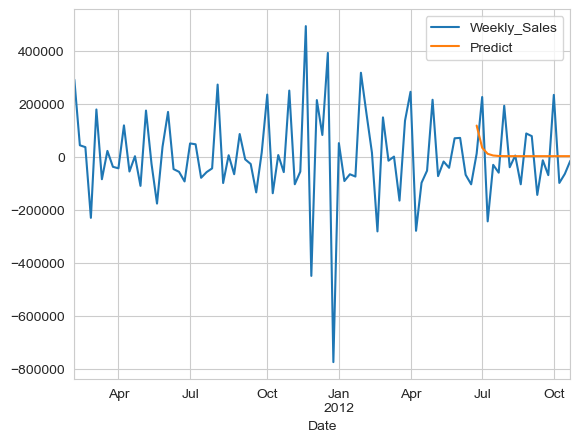

In [54]:
rolling_mean_decomposed_diff[['Weekly_Sales','Predict']].plot()

**Conclusion: ARIMA model is not working well, so we are going to use SARIMAX model on the same order**

In [55]:
from statsmodels.tsa.statespace.sarimax import SARIMAX,SARIMAXResults

model=SARIMAX(train,order=(1,0,1),seasonal_order=(1,0,1,52),enforce_stationarity=False)
model=model.fit()

C:\Users\dhine\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\dhine\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\dhine\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<Axes: xlabel='Date'>

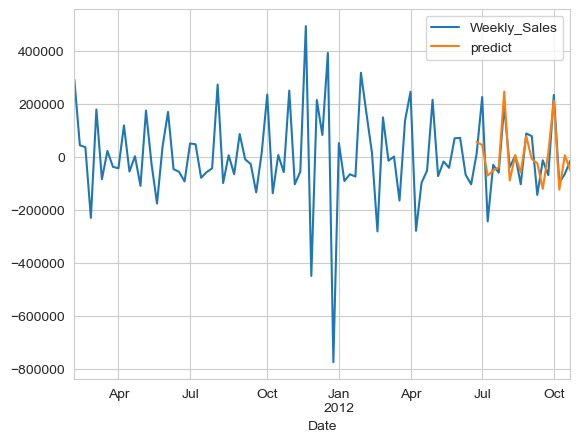

In [56]:
rolling_mean_decomposed_diff['predict'] = model.predict(start= len(train) ,
                                                       end=len(train)+len(test)- 1, 
                                                       dynamic=True)
rolling_mean_decomposed_diff[['Weekly_Sales','predict']].plot()

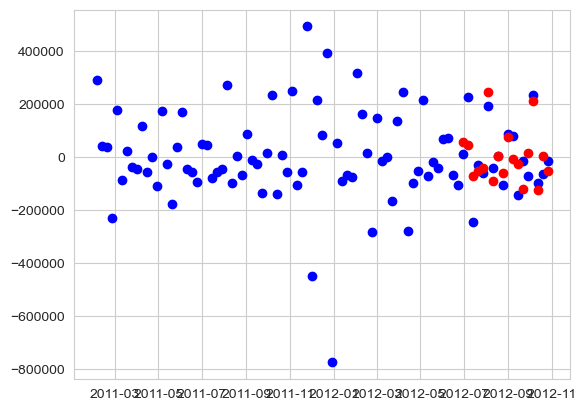

In [57]:
plt.plot(rolling_mean_decomposed_diff['Weekly_Sales'],'bo')
plt.plot(rolling_mean_decomposed_diff['predict'],'ro')

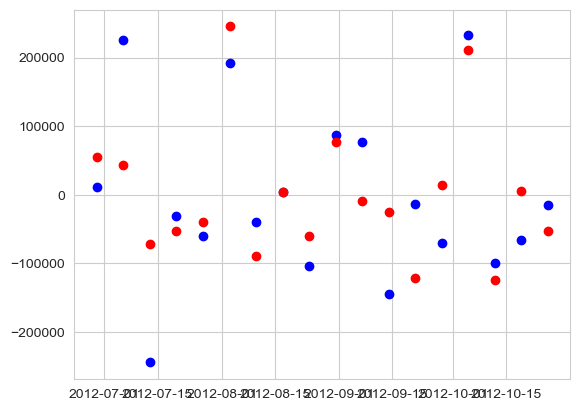

In [58]:
plt.plot(test,'bo')
plt.plot(rolling_mean_decomposed_diff['predict'],'ro')

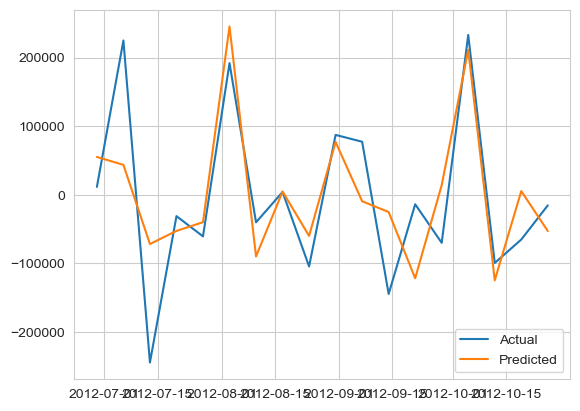

In [59]:
plt.plot(test, label='Actual')
plt.plot(rolling_mean_decomposed_diff['predict'], label='Predicted')
plt.legend()

**We can check the model performance from the above graph, it predicted nearly possible values.**

In [60]:
rolling_mean_decomposed_diff.drop('Predict',axis=1, inplace=True)

<Axes: xlabel='Date'>

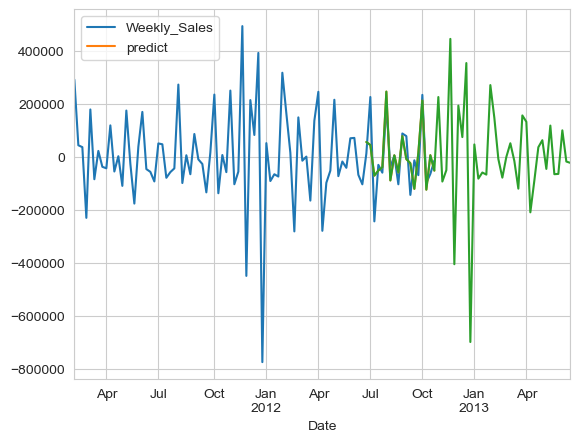

In [61]:
#predicting the projections for the next 1 year

forecast = model.forecast(steps=52)
rolling_mean_decomposed_diff.plot()
forecast.plot()

**From the above graph we can conclude that this model predicted the sales approximatly 90%**

**Checking the metrics**

In [62]:
from sklearn.metrics import mean_absolute_error

y_train=train
y_true = test
y_pred = rolling_mean_decomposed_diff['predict'].dropna()

def mean_absolute_scaled_error(y_true, y_pred, y_train):
    e_t = y_true - y_pred
    scale = mean_absolute_error(y_train[1:], y_train[:-1])
    return np.mean(np.abs(e_t / scale))

print('Mean absolute scaled error of this SARIMAX model is ',mean_absolute_scaled_error(y_true, y_pred, y_train))

Mean absolute scaled error of this SARIMAX model is  0.3083721955111752


**Lets check with randomly selected different stores**

In [69]:
results = {}
for i in np.random.randint(1,45,5):
    store = Stores[i]
    store = store.loc[:,['Date','Weekly_Sales']]
    store.index = store['Date']
    store.drop(['Date'],axis=1,inplace=True)
    model=SARIMAX(store,order=(1,0,1),seasonal_order=(1,0,1,52),enforce_stationarity=False)
    model=model.fit()
    predict = model.predict(start= len(store) ,end=len(store)+12, dynamic=True)
    results[i] = predict

C:\Users\dhine\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\dhine\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\dhine\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\dhine\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\dhine\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI w

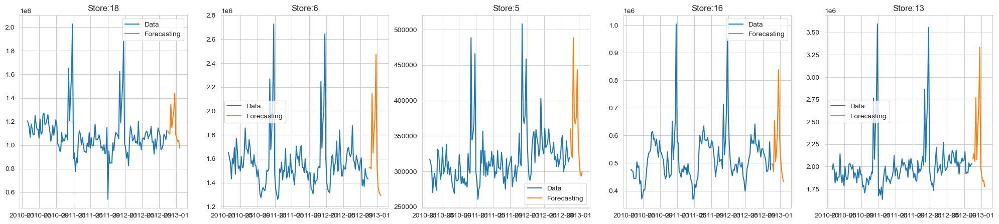

In [70]:
plt.subplots(1,5, figsize=(25,5))
i = 1
for value in results.keys():
    store=Stores[value]
    store = store.loc[:,['Date','Weekly_Sales']]
    store.index = store['Date']
    store.drop(['Date'],axis=1, inplace=True)
    result = results[value]
    plt.subplot(1,5,i)
    plt.plot(store, label='Data')
    plt.plot(result, label='Forecasting')
    plt.title(f'Store:{value}')
    plt.legend()
    i += 1

From the above graph we can see that this model forecasted the future sales approximately as same as the data set regarding the seasionality

**Lets forecast next 12 weeks of sales for each stores**

In [65]:
predictions = {}
for i in range(1,len(df.Store.unique())+1):
    store = Stores[i]
    store = store.loc[:,['Date','Weekly_Sales']]
    store.index = store['Date']
    store.drop(['Date'],axis=1,inplace=True)
    model=SARIMAX(store,order=(1,0,1),seasonal_order=(1,0,1,52),enforce_stationarity=False)
    model=model.fit()
    predict = model.predict(start= len(store) ,end=len(store)+12, dynamic=True)
    predictions[i] = predict

C:\Users\dhine\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\dhine\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\dhine\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\dhine\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\dhine\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI w

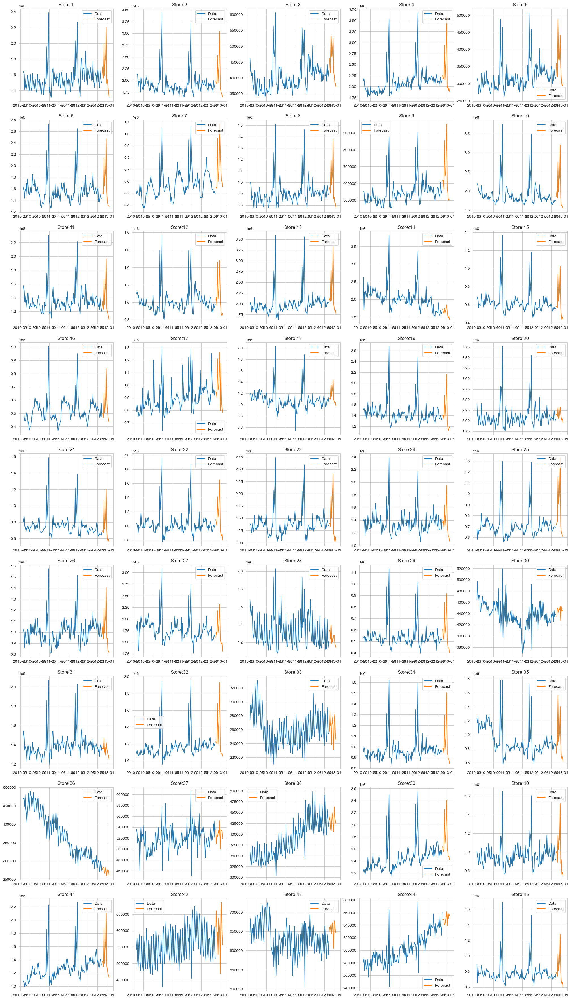

In [66]:
plt.subplots(9,5, figsize=(25,45))
for i in range (1,46):
    store=Stores[i]
    store = store.loc[:,['Date','Weekly_Sales']]
    store.index = store['Date']
    store.drop(['Date'],axis=1, inplace=True)
    predict = predictions[i]
    plt.subplot(9,5,i)
    plt.plot(store,label='Data')
    plt.plot(predict,label='Forecast')
    plt.title(f'Store:{i}')
    plt.legend()

**Conclusion**

**From the above graph we can see that the Stores 14,20,28,30,31,37,45 are having poor forecasting.**